In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
import torch
import sys
import pandas as pd
from pycocotools import mask as maskUtils
import torch

sys.path.append('../yolov5/')
from models.experimental import attempt_load, attempt_download
from utils.augmentations import letterbox
from utils.general import non_max_suppression
sys.path.append('../src')
from yolo_utils import plot_yolo_pred

In [3]:
matplotlib.use('nbAgg')

In [4]:
fold = 0
dir_path = '../input/yolo_ds/'
with open(dir_path + f'{fold}_val_images.txt') as file:
    lines = file.readlines()
    val_fns = [os.path.join(dir_path, fn.replace('\n','')) for fn in lines]
val_fns[0]

'../input/yolo_ds/./images/0-1851.jpg'

In [5]:
from models.yolo import Model as YoloModel
from utils.torch_utils import scale_img

def load_hub_model(path, conf=0.2, iou=0.50, max_det=100, hub_path='../yolov5/'):
    model = torch.hub.load(hub_path,
                           'custom',
                           path=path,
                           source='local',
                           force_reload=True)  # local repo
    model.conf = conf  # NMS confidence threshold
    model.iou  = iou  # NMS IoU threshold
    model.classes = None   # (optional list) filter by class, i.e. = [0, 15, 16] for persons, cats and dogs
    model.multi_label = False  # NMS multiple labels per box
    model.max_det = max_det  # maximum number of detections per image
    return model

def voc2coco(bboxes, image_height=720, image_width=1280):
    bboxes  = voc2yolo(bboxes, image_height, image_width)
    bboxes  = yolo2coco(bboxes, image_height, image_width)
    return bboxes

def voc2yolo(bboxes, image_height=720, image_width=1280):
    """
    voc  => [x1, y1, x2, y1]
    yolo => [xmid, ymid, w, h] (normalized)
    """
    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int
    bboxes[..., [0, 2]] = bboxes[..., [0, 2]]/ image_width
    bboxes[..., [1, 3]] = bboxes[..., [1, 3]]/ image_height
    w = bboxes[..., 2] - bboxes[..., 0]
    h = bboxes[..., 3] - bboxes[..., 1]
    bboxes[..., 0] = bboxes[..., 0] + w/2
    bboxes[..., 1] = bboxes[..., 1] + h/2
    bboxes[..., 2] = w
    bboxes[..., 3] = h
    return bboxes

def yolo2coco(bboxes, image_height=720, image_width=1280):
    """
    yolo => [xmid, ymid, w, h] (normalized)
    coco => [xmin, ymin, w, h]
    """
    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int
    # denormalizing
    bboxes[..., [0, 2]]= bboxes[..., [0, 2]]* image_width
    bboxes[..., [1, 3]]= bboxes[..., [1, 3]]* image_height
    # converstion (xmid, ymid) => (xmin, ymin)
    bboxes[..., [0, 1]] = bboxes[..., [0, 1]] - bboxes[..., [2, 3]]/2
    return bboxes

def _forward_augment_reef(self, x):
    """ Custom augmentation routine for yolo that's adjusted for reef competition """
    img_size = x.shape[-2:]  # height, width
    s = [1, 1.1, 1.2]  # scales
    f = [None, 3, None]  # flips (2-ud, 3-lr)
    y = []  # outputs
    for si, fi in zip(s, f):
        xi = scale_img(x.flip(fi) if fi else x, si, gs=int(self.stride.max()))
        yi = self._forward_once(xi)[0]  # forward
        # cv2.imwrite(f'img_{si}.jpg', 255 * xi[0].cpu().numpy().transpose((1, 2, 0))[:, :, ::-1])  # save
        yi = self._descale_pred(yi, fi, si, img_size)
        y.append(yi)
    y = self._clip_augmented(y)  # clip augmented tails
    return torch.cat(y, 1), None  # augmented inference, train

class ReefDetector:
    
    def __init__(self, 
                 weights, 
                 im_size=1280, 
                 device=None, 
                 conf_thres=0.2,
                 iou_thres=0.5,
                 max_det=100):
        
        self.device = device
        self.im_size = im_size
        self.model = load_hub_model(
            path=weights, 
            conf=conf_thres, 
            iou=iou_thres, 
            max_det=max_det
        )
        self.model.to(device)
        
        # custom augmentation routine
        self.model.model.model._forward_augment = _forward_augment_reef.__get__(
            self.model.model.model,
            YoloModel
        )
        
    def __call__(self, np_im, 
                 augment=False
                ):
        """ 
        Returns model predictions from rgb numpy image
        
        Returns
        sorted_pred_list : list of x1,y1,x2,y2,conf in conf descending order
        """
        
        height,width = np_im.shape[:2]
        results = self.model(np_im, size=self.im_size, augment=augment)
        
        preds   = results.pandas().xyxy[0]
        bboxes  = preds[['xmin','ymin','xmax','ymax']].values
        if len(bboxes) > 0:
            bboxes  = voc2coco(bboxes,height,width).astype(int)
            confs   = preds.confidence.values
        else:
            bboxes = []
            confs = []
            
        # Sort to descending confidence order
        if len(bboxes) > 0:
            confs, bboxes = zip(*sorted(zip(confs, bboxes), reverse=True))
        
        # combine to boxes and scores
        sorted_preds = [
            [box[0],box[1],box[0]+box[2],box[1]+box[3], conf] for box,conf in zip(bboxes, confs)]
        
        return sorted_preds

In [14]:
yolo_model = '../yolov5/reef/SC.3_OBJW3_yolov5l-15ep02/weights/best.pt'
reef_detector = ReefDetector(
    weights=yolo_model,
    conf_thres=0.369,
    device='cuda')

YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 
Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 


In [15]:
img_fn = val_fns[40]
img = cv2.cvtColor(
    cv2.imread(img_fn),
    cv2.COLOR_BGR2RGB
)
#plt.imshow(img)
#plt.show()

In [16]:
def imagewise_matches(threshold, iou):
    """
    Computes the tp,fp and fn at a given iou_threshold.
    Args:
        threshold (float): iou Threshold.
        iou (np array): IoU matrix. (pred x gts) preds should be in conf descendin order
    Returns:
        int: Number of true positives,
        int: Number of false positives,
        int: Number of false negatives.
    """
    if iou.ndim < 2:
        return 0,0,0
    
    tp = 0
    fp = 0
    col_indices = list(range(iou.shape[1]))
    used_col_indices = []
    for k, pred_row in enumerate(iou):
        # no more gts left
        if len(col_indices) == 0:
            # add remaining preds to fps and break
            fp += len(iou) - k
            break
        
        # select the max iou for the pred box from free gts
        max_iou = np.max(pred_row[np.array(col_indices)])
        
        # Check the original column index of selection
        pred_row_blocked = pred_row.copy()
        if len(used_col_indices) > 0:
            pred_row_blocked[np.array(used_col_indices)] = -1
        max_iou_col = list(pred_row_blocked).index(max_iou)
        
        # if the iou is above th, it's a match
        if max_iou > threshold:
            tp += 1
            col_indices.remove(max_iou_col)
            used_col_indices.append(max_iou_col)
        else:
            fp += 1
    
    # false negatives are the unmatched gts
    fn = len(col_indices)
    return tp, fp, fn

def f2_score(tp, fp, fn):
    beta = 2
    a = (1+beta**2) * tp
    b = (1+beta**2) * tp + (beta**2)*fn + fp
    return a / b if b != 0 else 1

def precision(tp, fp, fn):
    return tp / (tp + fp + 1e-16)

def recall(tp, fp, fn):
    return tp / (tp + fn + 1e-16)

def f2_at_3_to_8(ious):
    """ 
    Calculates imagewise f2@.3:.8, tps, fps and fns from iou matrix
    
    Returns:
    f2s : f2 scores at each 11 iou threshold
    tps : tp at each 11 iou threshold
    tps : fp at each 11 iou threshold
    fns : fn at each 11 iou threshold
    """
    ths = np.linspace(0.3,0.8,11)
    f2s = []
    tps, fps, fns = [], [], []
    for iou_th in ths:
        tp, fp, fn = imagewise_matches(iou_th, ious)
        f2s.append(f2_score(tp,fp,fn))
        tps.append(tp)
        fps.append(fp)
        fns.append(fn)
    return np.array(f2s), np.array(tps), np.array(fps), np.array(fns) 

In [17]:
pred = reef_detector(img)
pred

[[461, 217, 514, 263, 0.9268700480461121],
 [1121, 502, 1214, 582, 0.4512099623680115]]

In [18]:
pred = reef_detector(img, augment=True)
pred

[[462, 215, 513, 263, 0.9379992485046387],
 [41, 565, 85, 599, 0.46399247646331787],
 [1116, 506, 1213, 581, 0.37554794549942017]]

In [19]:
gts = []
with open(img_fn.replace('/images/','/labels/').replace('.png','.txt').replace('.jpg','.txt')) as f:
    annos = f.readlines()

im_h, im_w = img.shape[:2]
for anno in annos:
    lbl, xc, yc, w, h = anno.split(' ')
    xc = float(xc) * im_w
    yc = float(yc) * im_h
    w = float(w) * im_w
    h = float(h) * im_h
    x = (xc - w / 2)
    y = (yc - h / 2)
    gts.append([
        x,y,w,h
    ])

preds_xywh = [
    [
        p[0], 
        p[1],
        p[2] - p[0],
        p[3] - p[1],
    ] for p in pred
]
# box format : x,y,w,h
ious = maskUtils.iou(preds_xywh, gts, [0]*len(gts))
print(ious)
print('tp,fp,fn')
print(imagewise_matches(0.5, ious))
f2_at_3_to_8(ious)

[[    0.51923]
 [          0]
 [          0]]
tp,fp,fn
(1, 2, 0)


(array([    0.71429,     0.71429,     0.71429,     0.71429,     0.71429,           0,           0,           0,           0,           0,           0]),
 array([1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]),
 array([2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3]),
 array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1]))

<IPython.core.display.Javascript object>


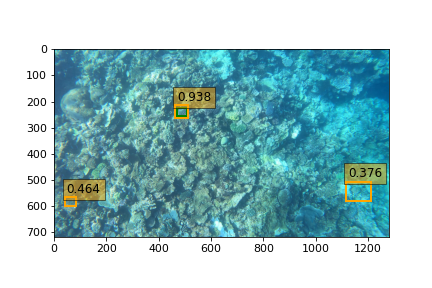

In [20]:
plt.close('all')
f, ax = plt.subplots(1,1)
plot_yolo_pred(img_fn, pred, ax=ax)
plt.show()

In [41]:
from matplotlib import animation, rc
rc('animation', html='jshtml')


def create_animation(ims):
    fig = plt.figure(figsize=(9, 9))
    plt.axis('off')
    im = plt.imshow(ims[0])

    def animate_func(i):
        im.set_array(ims[i])
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames = len(ims), interval = 1000//12)    

## Tracking

In [30]:
from norfair import Detection, Tracker, Video, draw_tracked_objects, draw_debug_metrics

# Helper to convert bbox in format [x_min, y_min, x_max, y_max, score] to norfair.Detection class
def to_norfair(detects, frame_id):
    result = []
    for x_min, y_min, x_max, y_max, score in detects:
        xc, yc = (x_min + x_max) / 2, (y_min + y_max) / 2
        w, h = x_max - x_min, y_max - y_min
        result.append(Detection(points=np.array([xc, yc]), scores=np.array([score]), data=np.array([w, h, frame_id])))
        
    return result

# Euclidean distance function to match detections on this frame with tracked_objects from previous frames
def euclidean_distance(detection, tracked_object):
    return np.linalg.norm(detection.points - tracked_object.estimate)


<IPython.core.display.Javascript object>


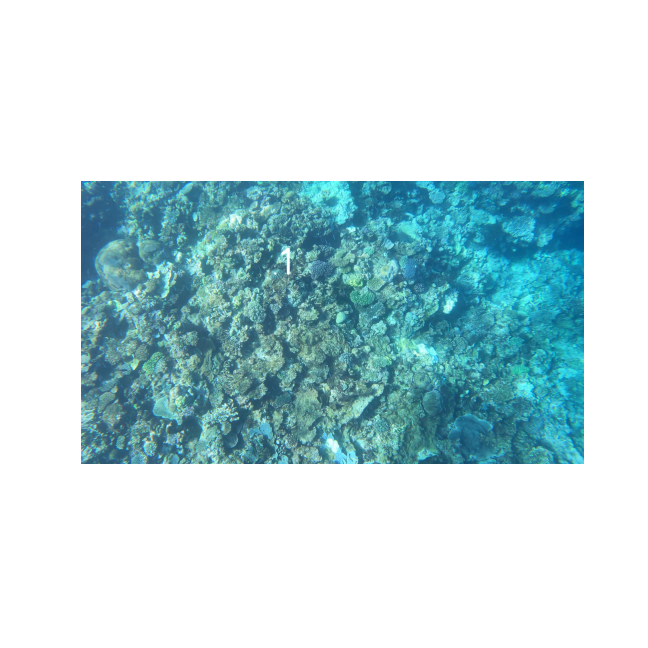

Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [50]:
import time
frame_id = 0
n_frames = 30
images = []

# Norfair https://github.com/tryolabs/norfair/blob/master/docs/README.md
tracker = Tracker(
    distance_function=euclidean_distance, 
    distance_threshold=30,
    hit_inertia_min=3,
    hit_inertia_max=6,
    initialization_delay=1,
)

for i, val_fn in enumerate(val_fns[35:]):
    if i >= n_frames: break
    
    img = cv2.cvtColor(
        cv2.imread(val_fn),
        cv2.COLOR_BGR2RGB
    )
    pred = reef_detector(img, augment=False)
    
    detects = [[*p[:5]] for p in pred]
    tracked_objects = tracker.update(
        detections=to_norfair(detects, frame_id))
    
    draw_tracked_objects(
        img,
        tracked_objects,
        id_size=3,
        color=(255,255,255),
        id_thickness=5
    )
    images.append(img)
    
create_animation(images)

In [21]:
from tqdm.auto import tqdm

def compute_f2(
    val_fns, reef_detector, augment=False,
    count_only_nonempty=False, count_max_samples=None, count_every_nth=1):
    
    imagewise_f2s = []
    all_tps, all_fps, all_fns = [0 for _ in range(11)], [0 for _ in range(11)], [0 for _ in range(11)]
    for i, img_fn in enumerate(val_fns[::count_every_nth]):
        
        if count_max_samples is not None:
            if i >= count_max_samples:
                break

        img = cv2.cvtColor(
            cv2.imread(img_fn),
            cv2.COLOR_BGR2RGB
        )
        im_h, im_w = img.shape[:2]

        gts = []
        with open(img_fn.replace('/images/','/labels/').replace('.png','.txt').replace('.jpg','.txt')) as f:
            annos = f.readlines()

        for anno in annos:
            lbl, xc, yc, w, h = anno.split(' ')
            xc = float(xc) * im_w
            yc = float(yc) * im_h
            w = float(w) * im_w
            h = float(h) * im_h
            x = (xc - w / 2)
            y = (yc - h / 2)
            gts.append([
                x,y,w,h
            ])
        
        if len(gts) == 0 and count_only_nonempty:
            continue

        pred = reef_detector(
            img, augment=augment)
        preds_xywh = [
            [
                p[0], 
                p[1],
                p[2] - p[0],
                p[3] - p[1],
            ] for p in pred
        ]
        # box format : x,y,w,h
        ious = maskUtils.iou(preds_xywh, gts, [0]*len(gts))
        if len(ious) == 0:
            f2s = [0 for _ in range(11)]
            tps = [0 for _ in range(11)]
            fps = [0 for _ in range(11)]
            fns = [len(gts) for _ in range(11)]
        else:
            f2s, tps, fps, fns = f2_at_3_to_8(ious)
        for th_i, (tp,fp,fn) in enumerate(zip(tps,fps,fns)):
            all_tps[th_i] += tp
            all_fps[th_i] += fp
            all_fns[th_i] += fn
        
        imagewise_f2s.append(np.mean(f2s))

    imagewise_f2s = np.array(imagewise_f2s)
    competition_f2 = np.mean(
        np.array(
            [f2_score(all_tps[th_i], all_fps[th_i], all_fns[th_i]) for th_i in range(11)]
        ))
    return competition_f2, imagewise_f2s

In [26]:
reef_detector = ReefDetector(
        weights=yolo_model,
        conf_thres=0.15,
        device='cuda')
competition_f2, _ = compute_f2(
        val_fns, reef_detector, augment=True,
        count_max_samples=None, count_every_nth=1)
print(f'f2 {competition_f2}')

YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 
Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 


f2 0.6256571724013734


In [25]:
conf_ths = np.arange(0.1, 0.3, 0.05)
competition_f2s = []
for th in conf_ths:
    print(f'th {th}')
    reef_detector = ReefDetector(
        weights=yolo_model,
        conf_thres=th,
        device='cuda')
    competition_f2, _ = compute_f2(
        val_fns, reef_detector, augment=False,
        count_max_samples=None, count_every_nth=1)
    print(f'f2 {competition_f2}')
    competition_f2s.append(competition_f2)

YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 


th 0.1


Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 


f2 0.6113436736274107
th 0.15000000000000002


Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 


f2 0.6142824385376706
th 0.20000000000000004


Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 


f2 0.6117071334462639
th 0.25000000000000006


Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 


KeyboardInterrupt: 

### th 0.2
- f2 0.6287531347425933

### th 0.2 with default augmentations
- f2 0.6240847876707396

### th 0.2 with custom augmentations [s1, s1.1LR, s1.2]
- f2 0.6547765946560888

In [27]:
plt.plot(conf_ths, competition_f2s)
plt.show()

/tmp/ipykernel_559394/462841140.py:2: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [246]:
plt.plot(
    [i for i in range(len(imagewise_f2s))],
    imagewise_f2s
)
plt.show()

In [244]:
competition_f2, _ = compute_f2(
        val_fns, reef_detector,
        conf_thres=0.05)

In [245]:
competition_f2

0.6134194923105429